In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from math import log10, sqrt

In [2]:
img = cv2.imread("Images/6/Lena.bmp")

In [3]:
def imshow(*args, figsize=25, to_rgb=True, title=None, fontsize=12):
    if isinstance(figsize, int):
        figsize = (figsize, figsize)
    images = args[0] if type(args[0]) is list else list(args)
    if to_rgb:
        images = list(map(lambda x: cv2.cvtColor(x, cv2.COLOR_BGR2RGB), images))
    if title is not None:
        assert len(title) == len(images), "Please provide a title for each image."
    plt.figure(figsize=figsize)
    for i in range(1, len(images)+1):
        plt.subplot(1, len(images), i)
        if title is not None:
            plt.title(title[i-1], fontsize=fontsize)
        plt.imshow(images[i-1])
        plt.axis('off')

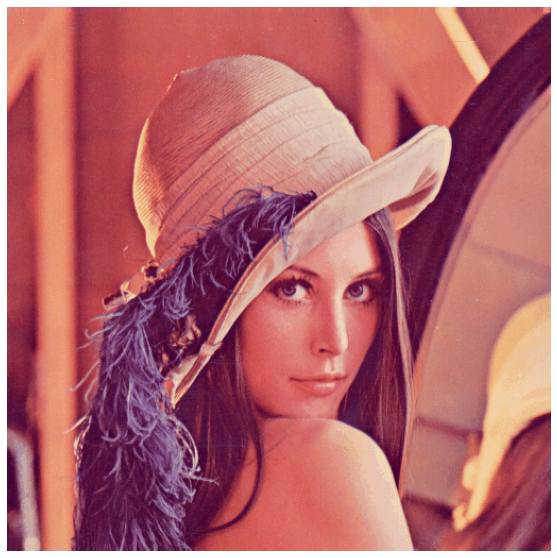

In [4]:
imshow(img, figsize=10)

## 6.1.1 

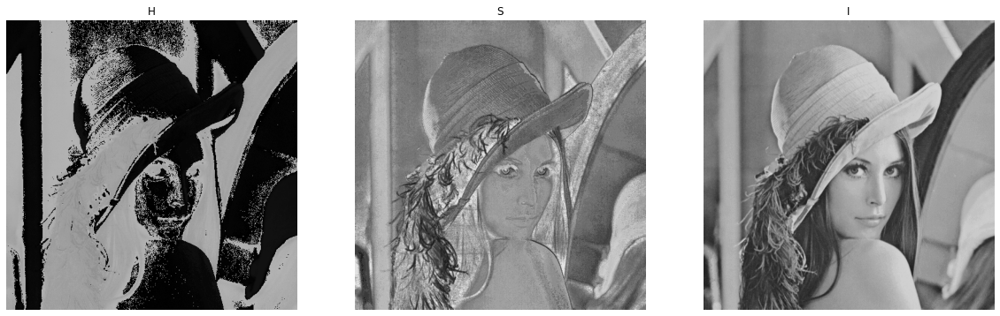

In [5]:
img_hls = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)
h, l, s = cv2.split(img_hls)

imshow(h, s, l, figsize=20, title = ['H', 'S', 'I'])

In [6]:
h

array([[  4,   4,   2, ...,   7,   4,   1],
       [  4,   4,   2, ...,   7,   4,   1],
       [  4,   4,   2, ...,   7,   4,   1],
       ...,
       [161, 161, 166, ..., 175, 178, 176],
       [161, 161, 163, ..., 178, 178, 178],
       [161, 161, 163, ..., 178, 178, 178]], dtype=uint8)

In [7]:
s

array([[154, 154, 160, ..., 164, 154, 125],
       [154, 154, 160, ..., 164, 154, 125],
       [154, 154, 160, ..., 164, 154, 125],
       ...,
       [170, 170, 161, ..., 116, 118, 129],
       [170, 170, 150, ..., 114, 114, 116],
       [170, 170, 150, ..., 114, 114, 116]], dtype=uint8)

In [8]:
l

array([[172, 172, 178, ..., 174, 162, 144],
       [172, 172, 178, ..., 174, 162, 144],
       [172, 172, 178, ..., 174, 162, 144],
       ...,
       [ 48,  48,  54, ..., 117, 119, 113],
       [ 48,  48,  59, ..., 123, 123, 125],
       [ 48,  48,  59, ..., 123, 123, 125]], dtype=uint8)

## 6.2.1 

In [9]:
def quantize_simulation(image, n_bits):
    coeff = 2**8 // 2**n_bits
    return (image // coeff) * coeff

In [10]:
def mse(imageA, imageB):
    # the 'Mean Squared Error' between the two images is the sum of the squared difference between the two images
    err = np.sum((imageA.astype("float") - imageB.astype("float")) ** 2)
    err /= float(imageA.shape[0] * imageA.shape[1])
    # return the MSE, the lower the error, the more "similar" the two images are
    return err

In [11]:
def psnr(original, compressed):
    mse = np.mean((original - compressed) ** 2)
    if(mse == 0):  # MSE is zero means no noise is present in the signal .
                  # Therefore PSNR have no importance.
        return 100
    max_pixel = 255.0
    psnr = 20 * log10(max_pixel / sqrt(mse))
    return psnr

In [12]:
def program():
    lena = cv2.imread("Images/6/Lena.bmp", cv2.IMREAD_GRAYSCALE)
    quantized6 = quantize_simulation(lena, 6)
    quantized5 = quantize_simulation(lena, 5)
    quantized4 = quantize_simulation(lena, 4)
    quantized3 = quantize_simulation(lena, 3)
    
    error6 = mse(lena, quantized6)
    error5 = mse(lena, quantized5)
    error4 = mse(lena, quantized4)
    error3 = mse(lena, quantized3)
    
    psn6 = psnr(lena, quantized6)
    psn5 = psnr(lena, quantized5)
    psn4 = psnr(lena, quantized4)
    psn3 = psnr(lena, quantized3)

    imshow(lena, quantized6, quantized5,quantized4,quantized3,title=['8','6','5','4','3'])
    print(quantized6)
    print(quantized5)
    print(quantized4)
    print(quantized3)
    
    print(error6, error5, error4, error3)
    print(psn6, psn5, psn4, psn3)

[[156 156 160 ... 164 148 124]
 [156 156 160 ... 164 148 124]
 [156 156 160 ... 164 148 124]
 ...
 [ 40  40  44 ...  96  96  92]
 [ 40  40  48 ... 100 100 100]
 [ 40  40  48 ... 100 100 100]]
[[152 152 160 ... 160 144 120]
 [152 152 160 ... 160 144 120]
 [152 152 160 ... 160 144 120]
 ...
 [ 40  40  40 ...  96  96  88]
 [ 40  40  48 ...  96  96  96]
 [ 40  40  48 ...  96  96  96]]
[[144 144 160 ... 160 144 112]
 [144 144 160 ... 160 144 112]
 [144 144 160 ... 160 144 112]
 ...
 [ 32  32  32 ...  96  96  80]
 [ 32  32  48 ...  96  96  96]
 [ 32  32  48 ...  96  96  96]]
[[128 128 160 ... 160 128  96]
 [128 128 160 ... 160 128  96]
 [128 128 160 ... 160 128  96]
 ...
 [ 32  32  32 ...  96  96  64]
 [ 32  32  32 ...  96  96  96]
 [ 32  32  32 ...  96  96  96]]
3.5216827392578125 17.090835571289062 78.83815002441406 313.44166564941406
42.66330132120192 35.80317064962315 29.16343936072466 28.30397287577132


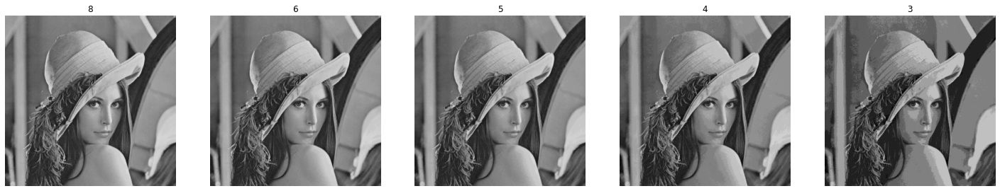

In [13]:
program()

## 6.2.2

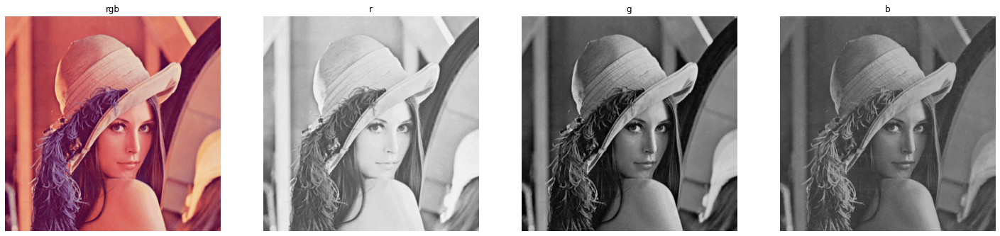

In [14]:
lena = cv2.imread("Images/6/Lena.bmp")
b, g, r = cv2.split(lena)
imshow(lena, r, g, b, title=['rgb','r','g','b'])

In [15]:
rq = quantize_simulation(r, 3)
gq = quantize_simulation(g, 3)
bq = quantize_simulation(b, 2)

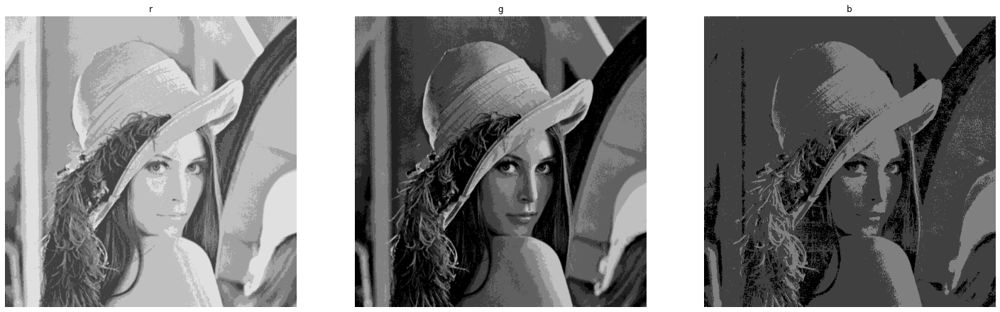

In [16]:
imshow(rq, gq, bq, title=['r','g','b'])

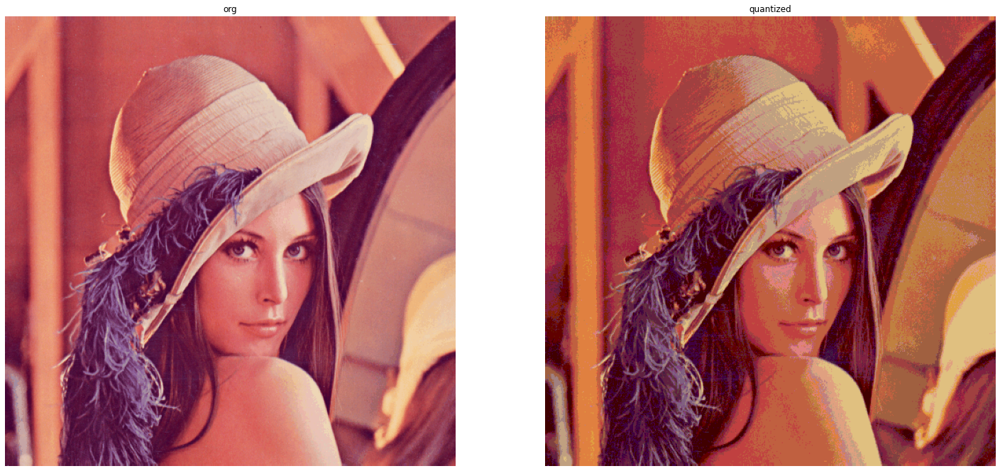

In [17]:
merged = cv2.merge([bq, gq, rq])
imshow(lena, merged, title=['org','quantized'])

## 6.2.3

In [18]:
bab = cv2.imread("Images/6/Baboon.bmp")

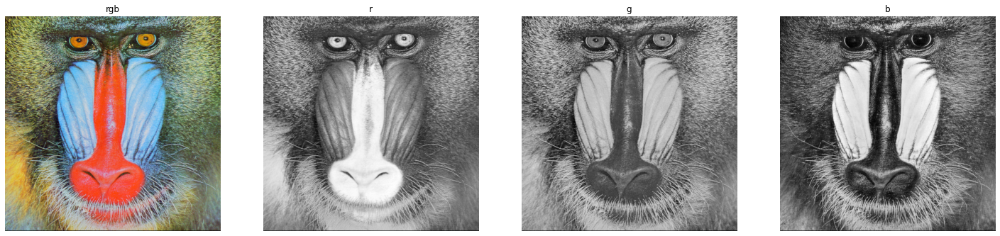

In [19]:
b, g, r = cv2.split(bab)
imshow(bab, r, g, b, title=['rgb','r','g','b'])

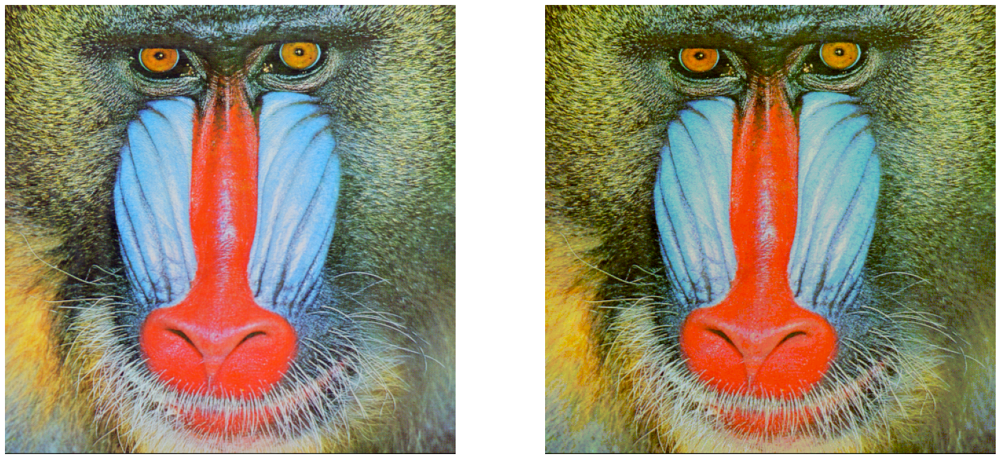

In [20]:
#32 different colors
rq = quantize_simulation(r, 4)
gq = quantize_simulation(g, 4)
bq = quantize_simulation(b, 2)
merged = cv2.merge([bq, gq, rq])
imshow(bab, merged)

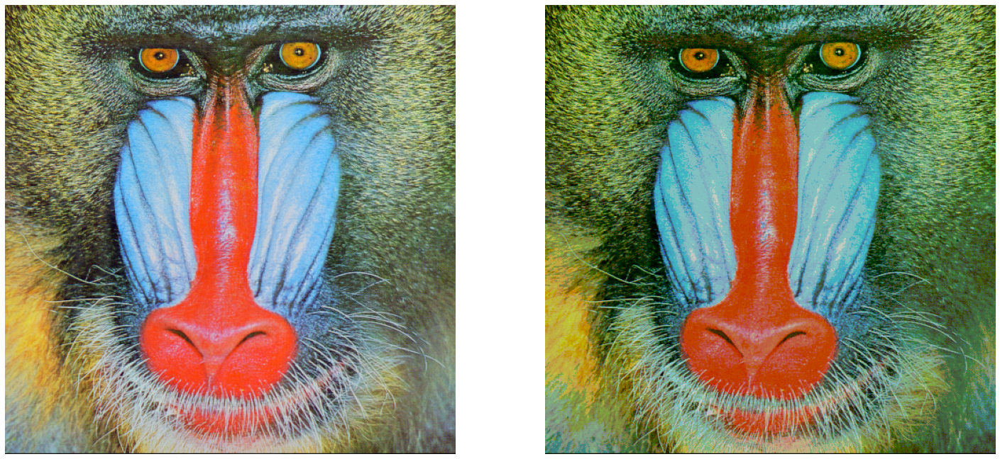

In [21]:
#16 different colors
rq = quantize_simulation(r, 2)
gq = quantize_simulation(g, 4)
bq = quantize_simulation(b, 2)
merged = cv2.merge([bq, gq, rq])
imshow(bab, merged)

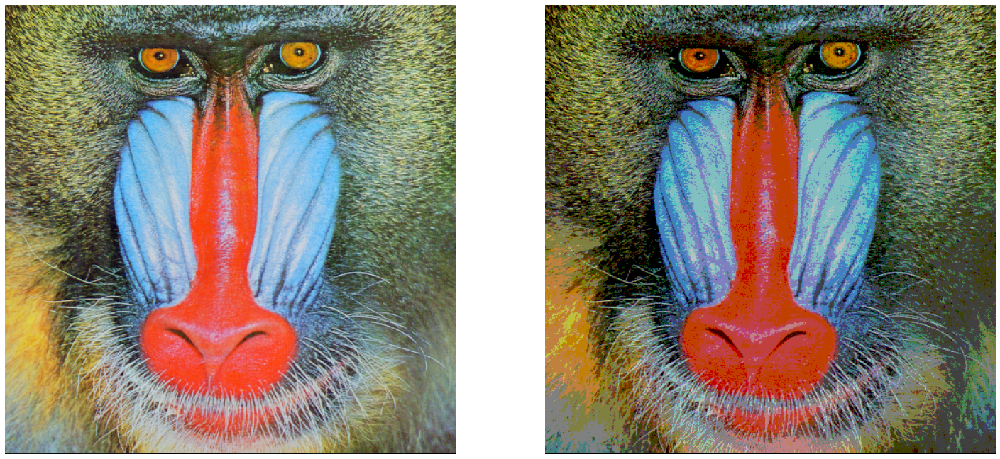

In [22]:
#8 different colors
rq = quantize_simulation(r, 2)
gq = quantize_simulation(g, 2)
bq = quantize_simulation(b, 2)
merged = cv2.merge([bq, gq, rq])
imshow(bab, merged)